In [1]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from numpy import cos
from math import log
from scipy.interpolate import interp1d
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from mpl_toolkits.mplot3d import Axes3D
from scipy.optimize import minimize_scalar
from scipy.optimize import minimize
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from sage.plot.plot3d.parametric_surface import ParametricSurface
import plotly.graph_objects as go
import plotly.express as px

In [2]:
T_linha = 25.6
T1= 26.4 
T2= 0.025
omega1= 0.017
phi1= -1.45

R1= 280.083 
R2= 0.555
omega2= 0.017
phi2=1.6

B_E=200
p_ME=0.9
p_ML=0.75
p_MP=0.85
tau_E=1
tau_P=1
# c1=0.019
# c2=-0.021
c1=0.00554
c2=-0.06737

D1=36.5
b1=0.04

A=12.5
B=15
C=-48.78

b2=0.09
mu_H = 0.00007
tau_H=10
DD=105
Tmin=14.5
gamma= 1/120
R_L = 450
N = 8558
M = 300000 
E_M0 = 50000
I_H0 = 1000 
I_M0 = 2500
if E_M0 is None:
        E_M0 = M / 100

S_H0 = N - I_H0
S_M0 = M - E_M0 - I_M0

In [3]:
def T(t):
        return T1 * (1 + T2 * cos(omega1 * t - phi1))
        
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
T_values = [T(t) for t in t_values]

def R(t):
        return R1 * (1 + R2 * cos(omega2 * t - phi2))
        
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
R_values = [R(t) for t in t_values]

def biting_rate(t):
        return (max(1e-5, T(t)-T_linha))/D1
        
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
biting_values = [biting_rate(t) for t in t_values]

def biting_rate_from_temperature(temperature):
    return (max(1e-5, temperature - T_linha)) / D1

# Usando T_values previamente calculados
biting_values_from_temperature = [biting_rate_from_temperature(temp) for temp in T_values]

def exposed_to_infected_rate(t):
        return  (max(1e-5, T(t)-Tmin))/DD
    
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
infection_values = [exposed_to_infected_rate(t) for t in t_values]

def exposed_to_infected_rate_from_temperature(temperature):
    return (max(1e-5, temperature-Tmin))/DD

# Usando T_values previamente calculados
exposed_to_infected_values_from_temperature = [exposed_to_infected_rate_from_temperature(temp) for temp in T_values]

def larvae_development_rate(t):
        return 1 / (c1 * T(t) + c2)

# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
larvae_dev = [larvae_development_rate(t) for t in t_values]

def larvae_development_rate_from_temperature(temperature):
    return 1 / (c1 * temperature + c2)

# Usando T_values previamente calculados
larvae_dev_values_from_temperature = [larvae_development_rate_from_temperature(temp) for temp in T_values]

def daily_survival_rate(t):
    return np.exp(-1 / (A * T(t)**2 + B * T(t) + C))

# Set up the time points
t_values = np.linspace(0, 365, 1000)

# Calculate daily survival rates
daily_survival = [daily_survival_rate(t) for t in t_values]

def daily_survival_rate_from_temperature(temperature):
    return np.exp(-1 / (A * temperature**2 + B * temperature + C))

# Usando T_values previamente calculados
daily_survival_from_temperature = [daily_survival_rate_from_temperature(temp) for temp in T_values]

def p_LT_teste(t):
    return np.exp(-(c1 * T(t) + c2))
    
def p_LR_teste(t):
    return (4*p_ML/R_L**2) * R(t) * (R_L - R(t))
    
def p_LRT_teste(t):
    return p_LR_teste(t)*p_LT_teste(t)

# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
larvae_survival = [p_LRT_teste(t) for t in t_values]

def p_LT_from_temperature(temperature):
    return np.exp(-(c1 * temperature + c2))
    
def p_LR_from_rain(rain):
    return (4*p_ML/R_L**2) * rain * np.maximum(1e-5, R_L - rain)   

def p_LRT_full(rain, temperature):
    return p_LR_from_rain(rain)*p_LT_from_temperature(temperature)

# Usando R_values e T_values previamente calculados
larvae_survival_from_rain = [p_LR_from_rain(precip) for precip in R_values]

# Usando R_values e T_values previamente calculados
larvae_survival_from_temperature = [p_LT_from_temperature(temp) for temp in T_values]

R_values_sorted = sorted(R_values)
T_values_sorted = sorted(T_values)

R_values_array = np.array(R_values_sorted)
T_values_array = np.array(T_values_sorted)

larvae_survival_from_rain_sorted = [p_LR_from_rain(precip) for precip in R_values_array]

larvae_survival_from_temperature_sorted = [p_LT_from_temperature(temp) for temp in T_values_array]

larvae_survival_from_rain_and_temperature_sorted = [lr * lt for lr, lt in zip(larvae_survival_from_rain_sorted, larvae_survival_from_temperature_sorted)]

larvae_survival_from_rain_and_temperature_sorted = [lr * lt for lr, lt in zip(larvae_survival_from_rain_sorted, larvae_survival_from_temperature_sorted)]

def p_ER_teste(t):
    return (4*p_ME/R_L**2) * R(t) * (R_L - R(t)) 
    
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
eggs_survival = [p_ER_teste(t) for t in t_values]

def p_ER_from_rain(rain):
    return (4 * p_ME / R_L**2) * rain * np.maximum(1e-5, R_L - rain) 
    
# Usando R_values previamente calculados
eggs_survival_from_rain = [p_ER_from_rain(precip) for precip in R_values]

def p_PR_teste(t):
        return (4*p_MP/R_L**2) * R(t) * (R_L - R(t))
    
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
pupae_survival = [p_PR_teste(t) for t in t_values]

def p_PR_from_rain(rain):
    return (4*p_MP/R_L**2) * rain * np.maximum(1e-5, R_L - rain)  
    
# Usando R_values previamente calculados
pupae_survival_from_rain = [p_PR_from_rain(precip) for precip in R_values]

def sporogonic_cycle_duration(t):
        return DD/(max(1e-5, T(t)-Tmin))
    
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
sporogonic_days = [sporogonic_cycle_duration(t) for t in t_values]

def sporogonic_cycle_duration_from_temperature(temperature):
    return DD/(max(1e-5, temperature-Tmin))

# Usando T_values previamente calculados
sporogonic_days_from_temperature = [sporogonic_cycle_duration_from_temperature(temp) for temp in T_values]

def survival_rate(t):
    return daily_survival_rate(t)**sporogonic_cycle_duration(t)

# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
survival_values = [survival_rate(t) for t in t_values]

def survival_rate_from_temperature(temperature):
    return daily_survival_rate_from_temperature(temperature)**sporogonic_cycle_duration_from_temperature(temperature)

survival_values_from_temperature = [survival_rate_from_temperature(temp) for temp in T_values]

def mortality_rate(t):
    return n(-log(daily_survival_rate(t)))
   
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
mortality_values = [mortality_rate(t) for t in t_values]

def mortality_rate_from_temperature(temperature):
    return n(-log(daily_survival_rate_from_temperature(temperature)))

# Usando T_values previamente calculados
mortality_values_from_temperature = [mortality_rate_from_temperature(temp) for temp in T_values]

def birth_rate_teste(t):
    return B_E * p_ER_teste(t) * p_LRT_teste(t) * p_PR_teste(t) / (tau_E + larvae_development_rate(t) + tau_P)
   
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
birth_values = [birth_rate_teste(t) for t in t_values]

def birth_rate_from_rain_and_temperature(rain, temperature):
    return np.maximum(0, B_E * p_ER_from_rain(rain) * p_LRT_full(rain, temperature) * p_PR_from_rain(rain) / (tau_E + larvae_development_rate_from_temperature(temperature) + tau_P)) 
    
# Usando T_values previamente calculados
birth_values_from_rain_and_temperature = [birth_rate_from_rain_and_temperature(precip, temp) for precip, temp in zip(R_values_array, T_values_array)]

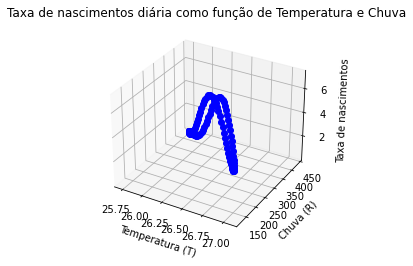

In [4]:
# Pontos no tempo
t_values = np.linspace(0, 365, 100)  

# Calcula T, R e taxa de nascimento em cada ponto de t
T_values = [T(t) for t in t_values]
R_values = [R(t) for t in t_values]
birth_values = [birth_rate_teste(t) for t in t_values]

# Cria o plot 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plota a superfície
ax.plot(T_values, R_values, birth_values, marker='o', linestyle='-', color='b')

ax.set_xlabel('Temperatura (T)')
ax.set_ylabel('Chuva (R)')
ax.set_zlabel('Taxa de nascimentos')

ax.set_title('Taxa de nascimentos diária como função de Temperatura e Chuva')

plt.show()

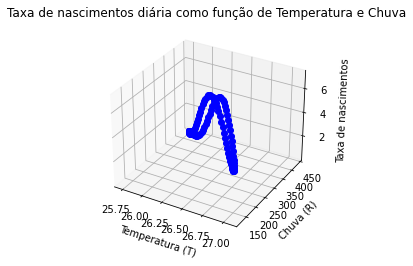

In [5]:
# Pontos no tempo
t_values = np.linspace(0, 365, 100)  

# Calcula T, R e taxa de nascimento em cada ponto de t
T_values = [T(t) for t in t_values]
R_values = [R(t) for t in t_values]
birth_values = [birth_rate_from_rain_and_temperature(precip, temp) for precip, temp in zip(R_values, T_values)]

# Cria o plot 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plota a superfície
ax.plot(T_values, R_values, birth_values, marker='o', linestyle='-', color='b')

ax.set_xlabel('Temperatura (T)')
ax.set_ylabel('Chuva (R)')
ax.set_zlabel('Taxa de nascimentos')

ax.set_title('Taxa de nascimentos diária como função de Temperatura e Chuva')

plt.show()

In [6]:
t_values = np.linspace(0, 365, 100)  

# Calcula valores correspondentes de T, R e p_LRT
T_values = T(t_values)
R_values = R(t_values)
survival_values = p_LRT_teste(t_values)

# Cria um scatter plot3D 
fig = go.Figure(data=[go.Scatter3d(x=T_values, y=R_values, z=survival_values, mode='markers')])

# Adiciona legenda nos eixos
fig.update_layout(scene=dict(xaxis_title='T(t)', yaxis_title='R(t)', zaxis_title='p_LRT(t)'),
                  scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

fig.update_layout(title='Probabilidade de sobrevivência das larvas como função de Temperatura e Chuva')

fig.show()

In [7]:
t_values = np.linspace(0, 365, 100)  

# Calcula valores correspondentes de T, R e b
T_values = T(t_values)
R_values = R(t_values)
b_values = birth_rate_teste(t_values)

# Cria um scatter plot3D 
fig = go.Figure(data=[go.Scatter3d(x=T_values, y=R_values, z=b_values, mode='markers')])

# Adiciona legenda nos eixos
fig.update_layout(scene=dict(xaxis_title='T(t)', yaxis_title='R(t)', zaxis_title='b(t)'),
                  scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

fig.update_layout(title='Taxa de nascimentos diária como função de Temperatura e Chuva')

fig.show()

#### Aumentando $R_L$ de 450 para 600:

In [8]:
#R_L=600

In [9]:
t_values = np.linspace(0, 365, 100)  

# Calcula valores correspondentes de T, R e p_LRT
T_values = T(t_values)
R_values = R(t_values)
survival_values = p_LRT_teste(t_values)

# Cria um scatter plot3D 
fig = go.Figure(data=[go.Scatter3d(x=T_values, y=R_values, z=survival_values, mode='markers')])

# Adiciona legenda nos eixos
fig.update_layout(scene=dict(xaxis_title='T(t)', yaxis_title='R(t)', zaxis_title='p_LRT(t)'),
                  scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

fig.update_layout(title='Probabilidade de sobrevivência das larvas como função de Temperatura e Chuva')

fig.show()

In [10]:
t_values = np.linspace(0, 365, 100)  

# Calcula valores correspondentes de T, R e b
T_values = T(t_values)
R_values = R(t_values)
b_values = birth_rate_teste(t_values)

# Cria um scatter plot3D 
fig = go.Figure(data=[go.Scatter3d(x=T_values, y=R_values, z=b_values, mode='markers')])

# Adiciona legenda nos eixos
fig.update_layout(scene=dict(xaxis_title='T(t)', yaxis_title='R(t)', zaxis_title='b(t)'),
                  scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

fig.update_layout(title='Taxa de nascimentos diária como função de Temperatura e Chuva')

fig.show()

In [11]:
print(f'Chuva mínima: {min(R_values_array)}')
print(f'Chuva máxima: {max(R_values_array)}')
print(f'Temperatura mínima: {min(T_values_array)}')
print(f'Temperatura máxima: {max(T_values_array)}')

Chuva mínima: 124.63739716264563
Chuva máxima: 435.52858214444745
Temperatura mínima: 25.740001515796333
Temperatura máxima: 27.05999975423487


In [12]:
temp = np.linspace(25.5, 27.5, 100)
rain = np.linspace(109, 391.5, 100)

X, Y = np.meshgrid(rain, temp)

Z = birth_rate_from_rain_and_temperature(X,Y)

In [13]:
fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y, colorscale='viridis')])

fig.update_layout(scene=dict(xaxis_title='R(t)', yaxis_title='T(t)', zaxis_title='b(R,T)'),
                  scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

fig.update_layout(title='Taxa de nascimentos diária como função de Temperatura e Chuva')

fig.show()

In [14]:
temp = np.linspace(0, 1000, 100)
rain = np.linspace(0, 750, 100)

X, Y = np.meshgrid(rain, temp)

Z = birth_rate_from_rain_and_temperature(X,Y)

In [15]:
fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y, colorscale='viridis')])

fig.update_layout(scene=dict(xaxis_title='R(t)', yaxis_title='T(t)', zaxis_title='b(R,T)'),
                  scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

fig.update_layout(title='Taxa de nascimentos diária como função de Temperatura e Chuva')

fig.show()

In [16]:
temp = np.linspace(25.5, 27.5, 100)
rain = np.linspace(109, 391.5, 100)

X, Y = np.meshgrid(rain, temp)

Z = p_LRT_full(X,Y)

In [17]:
fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y, colorscale='viridis')])

fig.update_layout(scene=dict(xaxis_title='R(t)', yaxis_title='T(t)', zaxis_title='p_LRT(R,T)'),
                  scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

fig.update_layout(title='Probabilidade de sobrevivência das larvas como função de Temperatura e Chuva')

fig.show()

In [18]:
temp = np.linspace(0, 1000, 100)
rain = np.linspace(0, 750, 100)

X, Y = np.meshgrid(rain, temp)

Z = p_LRT_full(X,Y)

In [19]:
fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y, colorscale='viridis')])

fig.update_layout(scene=dict(xaxis_title='R(t)', yaxis_title='T(t)', zaxis_title='p_LRT(R,T)'),
                  scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

fig.update_layout(title='Probabilidade de sobrevivência das larvas como função de Temperatura e Chuva')

fig.show()